In [1]:
import ee
# authentication
service_account = 'id-80b-capstone@a-capstone.iam.gserviceaccount.com'
credentials = ee.ServiceAccountCredentials(service_account, 'a-capstone-fec01f15055b.json')
ee.Initialize(credentials)

In [2]:
import folium
import geemap
import os
import IPython.display as disp
from IPython.display import Image
import glob

In [3]:
# !pip install rasterio
import rasterio #for reading images

In [4]:
from sklearn import cluster
from sklearn.metrics import silhouette_score
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt 

In [5]:
import sys

sys.path.append('../src/data/')

from make_dataset import exportData, computeMNDWI, readData, computeNDWI
from etl import computeNDWI

Use this website to generate new JSON structures: https://geojson.io/#new&map=10.57/39.6198/-121.4357

In [6]:
# might be useful later
geoJSON = {
  "type": "FeatureCollection",
  "features": [
    {
      "type": "Feature",
      "properties": {},
      "geometry": {
        "coordinates": [
          [
            [
              -121.57931418110947,
              39.73107014130147
            ],
            [
              -121.57931418110947,
              39.524185236048766
            ],
            [
              -121.28277910072802,
              39.524185236048766
            ],
            [
              -121.28277910072802,
              39.73107014130147
            ],
            [
              -121.57931418110947,
              39.73107014130147
            ]
          ]
        ],
        "type": "Polygon"
      }
    }
  ]
}

In [7]:
coords = geoJSON['features'][0]['geometry']['coordinates']
aoi = ee.Geometry.Polygon(coords)

start_date = '2013-03-18'
end_date = '2022-10-24'

In [8]:
# Define a method for displaying Earth Engine image tiles on a folium map.
def add_ee_layer(self, ee_image_object, vis_params, name):
    """Adds a method for displaying Earth Engine image tiles to folium map."""
    map_id_dict = ee.Image(ee_image_object).getMapId(vis_params)
    folium.raster_layers.TileLayer(
        tiles=map_id_dict['tile_fetcher'].url_format,
        attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
        name=name,
        overlay=True,
        control=True
    ).add_to(self)

# Add Earth Engine drawing method to folium.
folium.Map.add_ee_layer = add_ee_layer

Used some code from here: https://gis.stackexchange.com/questions/332259/calculate-ndwi-of-each-image-in-a-imagecollection

In [9]:
# import Landsat 8 Level 2, Collection 2, Tier 1 surface reflectance
images_sr = ee.ImageCollection("LANDSAT/LC08/C02/T1_L2").filterDate(start_date, end_date).filterBounds(aoi)

In [10]:
# filter cloudy images, threshold of 50%
images_sr = images_sr.filter(ee.Filter.lte('CLOUD_COVER', 0.50))

### Export Image Collection Section

In [11]:
# SR_B3 band
sr_b3 = images_sr.select('SR_B3')
collection_list = sr_b3.toList(sr_b3.size())
collection_size = collection_list.size().getInfo()
# has a bug, has many dates that shouldnt be there. However, I will fix later
dates = geemap.image_dates(sr_b3, date_format='YYYY-MM-dd').getInfo()

In [12]:
# exportData(
#     aoi,
#     dates, 
#     collection_size, 
#     collection_list, 
#     "../data/images/LANDSAT8_SR_B3/LANDSAT8_SR_B3_{}.tif"
# )

In [13]:
# SR_B5 band
sr_b5 = images_sr.select('SR_B5')
collection_list = sr_b5.toList(sr_b5.size())
collection_size = collection_list.size().getInfo()
# has a bug, has many dates that shouldnt be there. However, I will fix later
dates = geemap.image_dates(sr_b5, date_format='YYYY-MM-dd').getInfo()

In [14]:
# exportData(
#     aoi,
#     dates, 
#     collection_size, 
#     collection_list, 
#     "../data/images/LANDSAT8_SR_B5/LANDSAT8_SR_B5_{}.tif"
# )

In [15]:
# ndwi band
ndwi_images = images_sr.map(computeNDWI).select("NDWI")
collection_list = ndwi_images.toList(ndwi_images.size())
collection_size = collection_list.size().getInfo()
# has a bug, has many dates that shouldnt be there. However, I will fix later
dates = geemap.image_dates(ndwi_images, date_format='YYYY-MM-dd').getInfo()

In [16]:
# exportData(
#     aoi,
#     dates, 
#     collection_size, 
#     collection_list, 
#     "../data/images/LANDSAT8_NDWI/LANDSAT8_NDWI_{}.tif"
# )

In [17]:
# mndwi band
mndwi_images = images_sr.map(computeMNDWI).select("MNDWI")
collection_list = mndwi_images.toList(mndwi_images.size())
collection_size = collection_list.size().getInfo()
# has a bug, has many dates that shouldnt be there. However, I will fix later
dates = geemap.image_dates(mndwi_images, date_format='YYYY-MM-dd').getInfo()

In [18]:
# exportData(
#     aoi,
#     dates, 
#     collection_size, 
#     collection_list, 
#     "../data/images/LANDSAT8_MNDWI/LANDSAT8_MNDWI_{}.tif"
# )

### Read Data Section
Make a list of all gathered images in the form of (date, image) tuples.

In [19]:
mndwi_img_lst = readData("../data/images/LANDSAT8_MNDWI/")

In [20]:
print(mndwi_img_lst[0][0])
print(mndwi_img_lst[0][1].shape)

2013-06-03
(781, 863)


In [21]:
# provide path to images
ndwi_img_lst = readData("../data/images/LANDSAT8_NDWI/")

In [22]:
print(ndwi_img_lst[0][0])
print(ndwi_img_lst[0][1].shape)

2013-06-03
(781, 863)


In [23]:
b3_img_lst = readData("../data/images/LANDSAT8_SR_B3/")

In [24]:
print(b3_img_lst[0][0])
print(b3_img_lst[0][1].shape)

2013-06-03
(781, 863)


In [25]:
b5_img_lst = readData("../data/images/LANDSAT8_SR_B5/")

In [26]:
def NDWI(b3_list, b5_list):
    
    temp_list = []
    
    if len(b3_list) != len(b5_list):
        print("B3 and B5 lists need to be the same length")
        return
    
    for i in range(0, len(b3_list)):
        den = (b3_list[i][1] + b5_list[i][1]).astype(np.int)
        num = np.subtract(b3_list[i][1].astype(np.int), b5_list[i][1].astype(np.int))
        ndwi_img = num / den
        temp_list.append((b3_list[i][0], ndwi_img))
    
    return temp_list

computed_ndwi_lst = NDWI(b3_img_lst, b5_img_lst)

/tmp/ipykernel_202/3648510942.py:10: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  den = (b3_list[i][1] + b5_list[i][1]).astype(np.int)
/tmp/ipykernel_202/3648510942.py:11: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecate

Apply spatial median filtering in an effort to reduce cloud noise

In [27]:
spatial_median_img_lst = []

for i in range(1, len(ndwi_img_lst) - 1):
    
    img1 = ndwi_img_lst[i-1][1]
    img2 = ndwi_img_lst[i][1]
    img3 = ndwi_img_lst[i+1][1]
    
    median_img = np.median(
        np.dstack([img1,img2,img3]), 
        -1
    )
    spatial_median_img_lst.append((
        "{}::{}::{}".format(ndwi_img_lst[i-1][0],ndwi_img_lst[i][0],ndwi_img_lst[i+1][0]),
        median_img
    ))

### Data Viz Section

2013-06-03


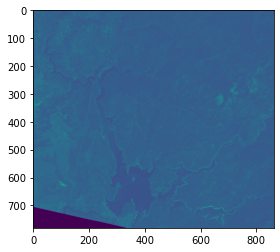

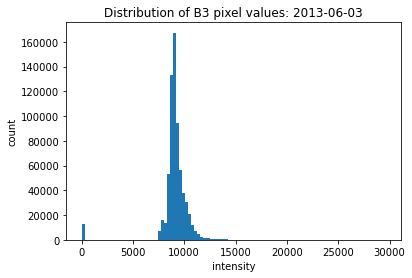

In [28]:
print(b3_img_lst[0][0])
plt.imshow(b3_img_lst[0][1])
plt.show()

plt.hist(
    b3_img_lst[0][1].flatten(), 
    bins=100
)
plt.ylabel("count")
plt.xlabel("intensity")
plt.title("Distribution of B3 pixel values: {}".format(b3_img_lst[0][0]))
plt.show()

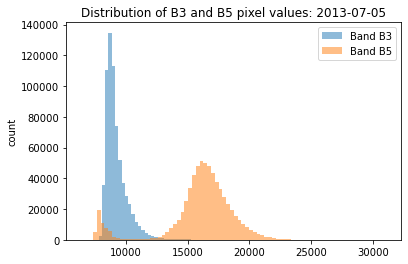

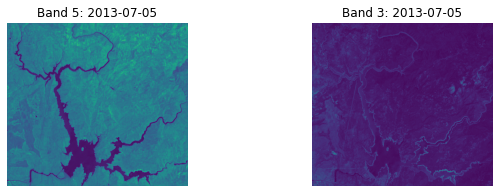

In [29]:
plt.hist(
    b3_img_lst[1][1].flatten(), 
    bins=80,
    alpha=0.5,
    label="Band B3"
)
plt.hist(
    b5_img_lst[1][1].flatten(), 
    bins=80,
    alpha=0.5,
    label="Band B5"
)
plt.legend()
plt.ylabel("count")
plt.title("Distribution of B3 and B5 pixel values: {}".format(b5_img_lst[1][0]))
plt.show()

fig, axes = plt.subplots(ncols=2, figsize=(10, 3))
ax = axes.ravel()

ax[0].imshow(b5_img_lst[1][1])
ax[0].set_title('Band 5: {}'.format(b5_img_lst[1][0]))

ax[1].imshow(b3_img_lst[1][1])
ax[1].set_title('Band 3: {}'.format(b3_img_lst[1][0]))


for a in ax:
    a.axis('off')

plt.show()

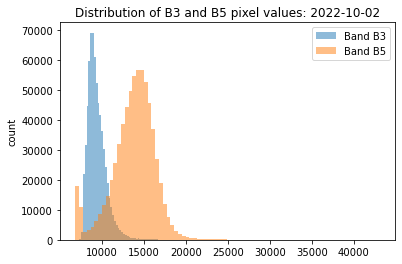

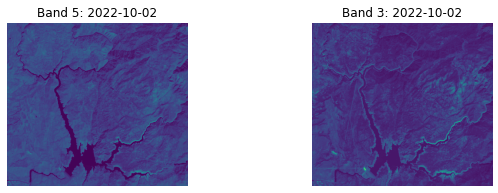

In [30]:
plt.hist(
    b3_img_lst[-1][1].flatten(), 
    bins=80,
    alpha=0.5,
    label="Band B3"
)
plt.hist(
    b5_img_lst[-1][1].flatten(), 
    bins=80,
    alpha=0.5,
    label="Band B5"
)

plt.legend()
plt.ylabel("count")
plt.title("Distribution of B3 and B5 pixel values: {}".format(b5_img_lst[-1][0]))
plt.show()

fig, axes = plt.subplots(ncols=2, figsize=(10, 3))
ax = axes.ravel()

ax[0].imshow(b5_img_lst[-1][1])
ax[0].set_title('Band 5: {}'.format(b5_img_lst[-1][0]))

ax[1].imshow(b3_img_lst[-1][1])
ax[1].set_title('Band 3: {}'.format(b3_img_lst[-1][0]))


for a in ax:
    a.axis('off')

plt.show()

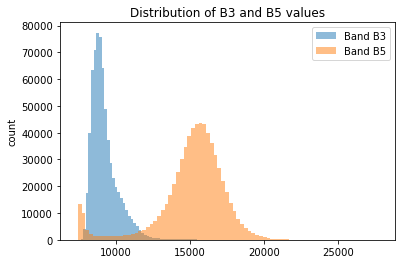

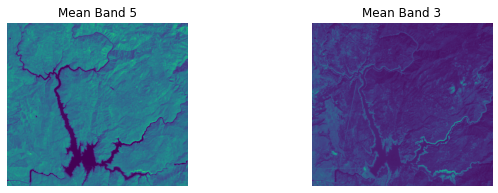

In [31]:
b3_mean_per_pixel = []
b5_mean_per_pixel = []
for i in range(1, len(b3_img_lst)):
    b3_mean_per_pixel.append(b3_img_lst[i][1])
    b5_mean_per_pixel.append(b5_img_lst[i][1])

b3_mean_per_pixel  = np.mean(
        np.dstack(b3_mean_per_pixel), 
        -1
    )
b5_mean_per_pixel  = np.mean(
        np.dstack(b5_mean_per_pixel), 
        -1
    )

plt.hist(
    b3_mean_per_pixel.flatten(), 
    bins=80,
    alpha=0.5,
    label="Band B3"
)
plt.hist(
    b5_mean_per_pixel.flatten(), 
    bins=80,
    alpha=0.5,
    label="Band B5"
)
plt.title("Distribution of B3 and B5 values")
plt.legend()
plt.ylabel("count")
plt.show()


fig, axes = plt.subplots(ncols=2, figsize=(10, 3))
ax = axes.ravel()

ax[0].imshow(b5_mean_per_pixel)
ax[0].set_title('Mean Band 5')

ax[1].imshow(b3_mean_per_pixel)
ax[1].set_title('Mean Band 3')


for a in ax:
    a.axis('off')

plt.show()

/tmp/ipykernel_202/2347039708.py:1: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  den = (b3_img_lst[1][1] + b5_img_lst[1][1]).astype(np.int)
/tmp/ipykernel_202/2347039708.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depre

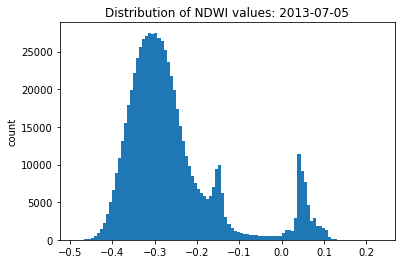

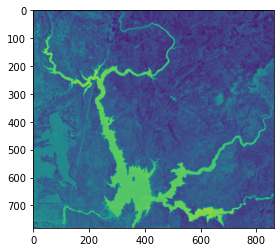

In [32]:
den = (b3_img_lst[1][1] + b5_img_lst[1][1]).astype(np.int)
num = (np.subtract(b3_img_lst[1][1].astype(np.int), b5_img_lst[1][1].astype(np.int)))
ndwi_img = num / den
plt.hist(ndwi_img.flatten(),bins=100)
plt.title("Distribution of NDWI values: {}".format(b3_img_lst[1][0]))
plt.ylabel("count")
plt.show()

plt.imshow(ndwi_img)
plt.show()

2013-06-03::2013-07-05::2013-07-21


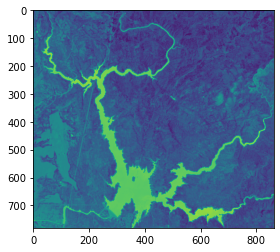

In [33]:
print(spatial_median_img_lst[0][0])
plt.imshow(spatial_median_img_lst[0][1])
plt.show()

2022-08-31::2022-09-16::2022-10-02


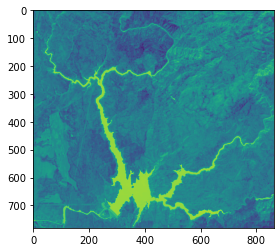

In [34]:
print(spatial_median_img_lst[-1][0])
plt.imshow(spatial_median_img_lst[-1][1])
plt.show()

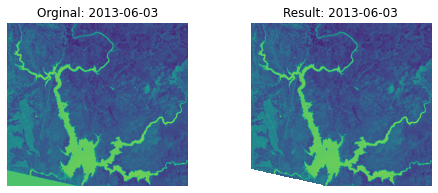

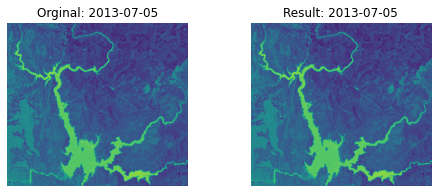

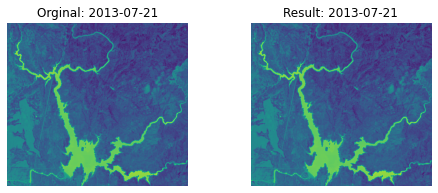

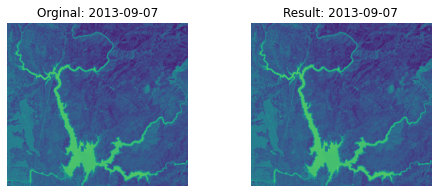

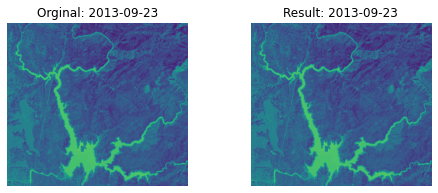

...

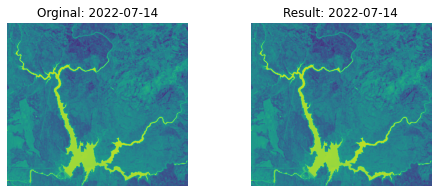

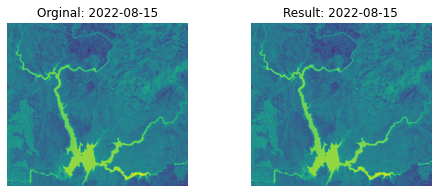

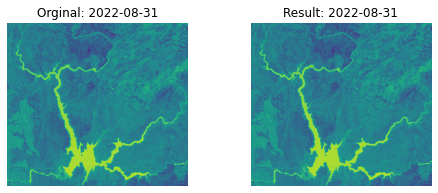

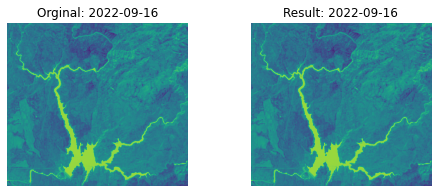

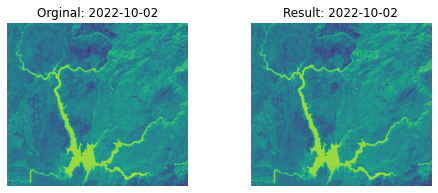

In [35]:
for n, c in zip(ndwi_img_lst, computed_ndwi_lst):
    
    fig, axes = plt.subplots(ncols=2, figsize=(8, 3))
    ax = axes.ravel()

    ax[0].imshow(n[1])
    ax[0].set_title('Orginal: {}'.format(n[0]))

    ax[1].imshow(c[1])
    ax[1].set_title('Result: {}'.format(c[0]))

    for a in ax:
        a.axis('off')

    plt.show()

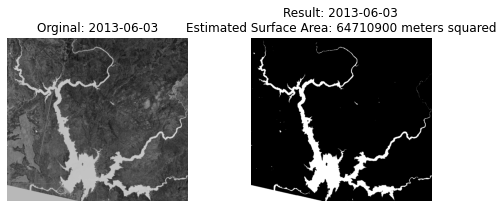

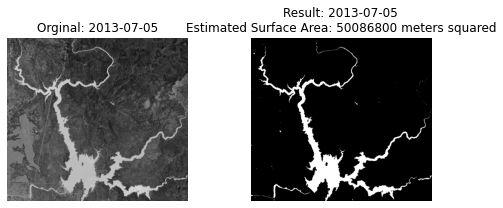

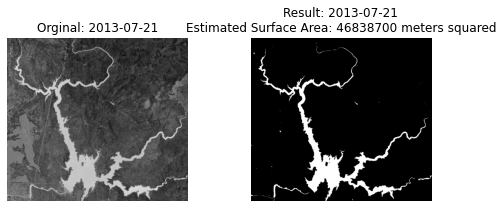

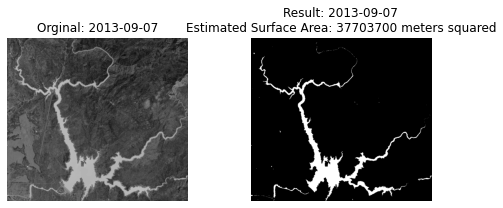

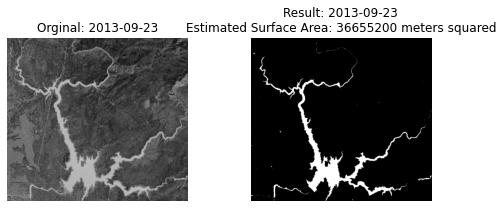

...

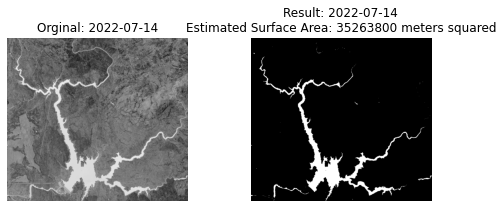

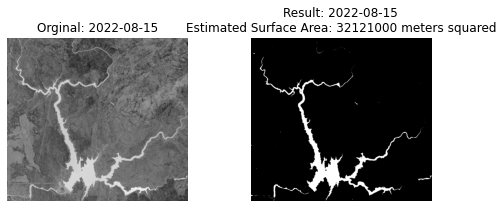

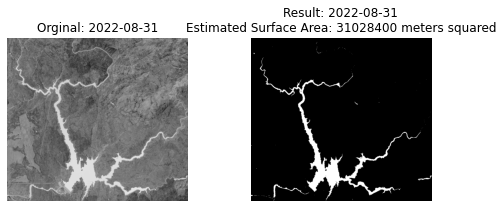

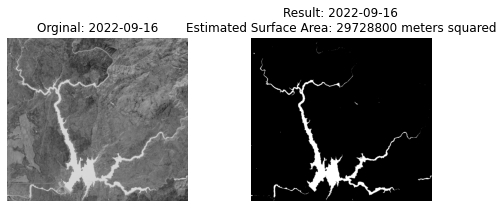

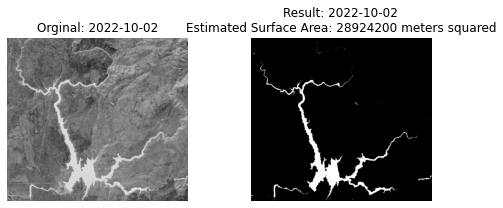

In [36]:
from skimage import data
from skimage.filters import try_all_threshold
from skimage.filters import threshold_minimum


est_surface_areas = []
binary_images = []

for d, i in ndwi_img_lst:
    thresh = threshold_minimum(i)
    binary = i > thresh
    
    binary_images.append(binary)
    
    estimated_surface_area = (binary.flatten().sum() * (30 ** 2))
    est_surface_areas += [(d, estimated_surface_area)]

    fig, axes = plt.subplots(ncols=2, figsize=(8, 3))
    ax = axes.ravel()

    ax[0].imshow(i, cmap=plt.cm.gray)
    ax[0].set_title('Orginal: {}'.format(d))

    ax[1].imshow(binary, cmap=plt.cm.gray)
    ax[1].set_title('Result: {}\nEstimated Surface Area: {} meters squared'.format(d, estimated_surface_area))

    for a in ax:
        a.axis('off')

    plt.show()

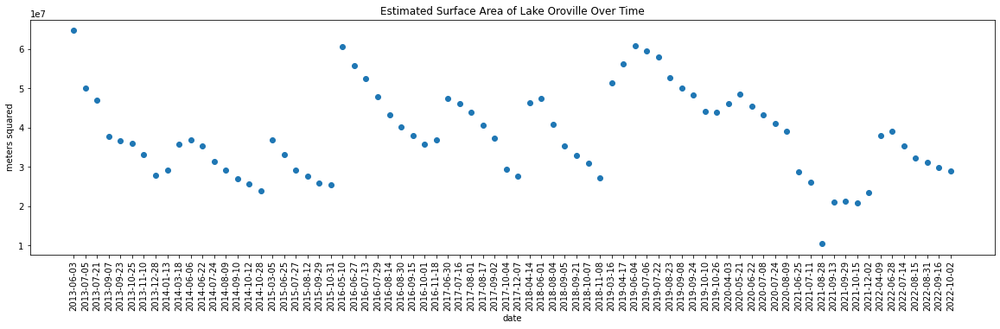

In [37]:
sorted(est_surface_areas, key=lambda x: x[0])
d = [x[0] for x in est_surface_areas if x[1] < 2e8]
g = [x[1] for x in est_surface_areas if x[1] < 2e8]
plt.figure(figsize=(20, 5))
plt.ylabel('meters squared')
plt.xlabel('date')
plt.xticks(rotation=90)
plt.scatter(d, g)
plt.title('Estimated Surface Area of Lake Oroville Over Time')
plt.show()

/tmp/ipykernel_202/1532861495.py:6: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gb = fr.groupby('year').median()


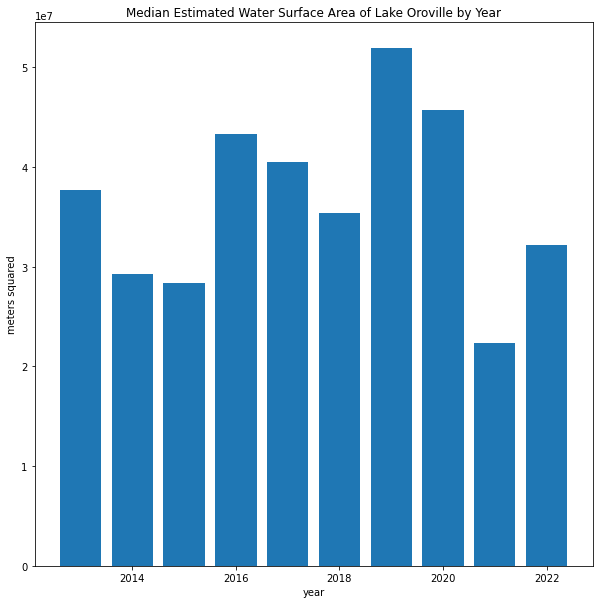

In [38]:
import pandas as pd

fr = pd.DataFrame(est_surface_areas, columns=['date', 'est_surface_area'])
fr['date'] = pd.to_datetime(fr['date'])
fr['year'] = fr['date'].dt.year
gb = fr.groupby('year').median()

plt.figure(figsize=(10, 10))
plt.ylabel('meters squared')
plt.xlabel('year')
plt.title('Median Estimated Water Surface Area of Lake Oroville by Year')
plt.bar(gb.index, gb.est_surface_area)
plt.show()

In [39]:
gb

,est_surface_area
year,
2013,37703700.0
2014,29250000.0
2015,28347300.0
2016,43284600.0
2017,40482900.0
2018,35403300.0
2019,51909750.0
2020,45654750.0
2021,22354200.0


/tmp/ipykernel_202/3264674772.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gb = fr.groupby('season').median()


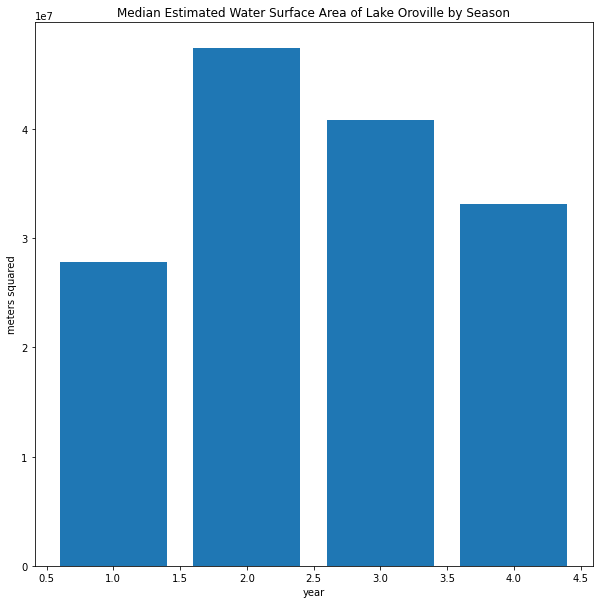

In [40]:
# where 1 is winter, 2 is spring, 3 is summer, and 4 is fall

fr['season'] = fr['date'].dt.month % 12 // 3 + 1
gb = fr.groupby('season').median()

plt.figure(figsize=(10, 10))
plt.ylabel('meters squared')
plt.xlabel('year')
plt.title('Median Estimated Water Surface Area of Lake Oroville by Season')
plt.bar(gb.index, gb.est_surface_area)
plt.show()

In [41]:
t = np.array(binary_images)

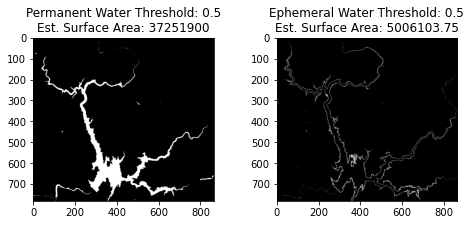

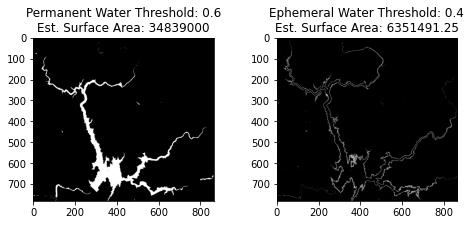

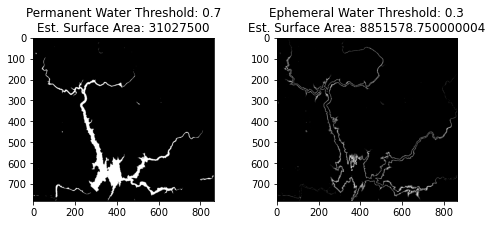

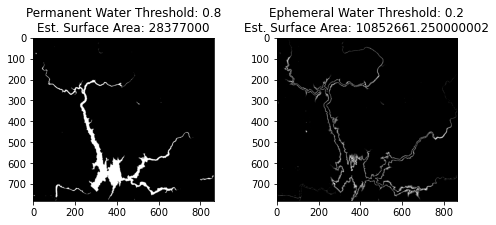

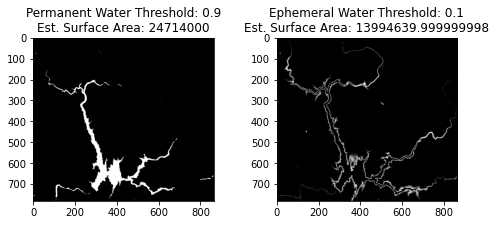

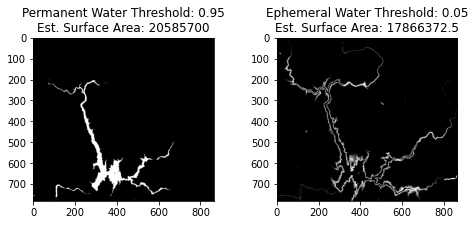

In [59]:
for thresh in [.5, .6, .7, .8, .9, .95]:
    avg_pixel = np.mean(t, 0)
    
    perm = avg_pixel > thresh # gets average of each pixel across all 80 images
    ephemeral = np.where((avg_pixel > 0.1) & (avg_pixel <= thresh), avg_pixel, 0)
    
    esa_perm = (perm.flatten().sum() * (30 ** 2)) # estimates surface area for permanent water
    esa_ephemeral = (ephemeral.flatten().sum() * (30 ** 2)) # estimates surface area for ephemeral water

    fig, axes = plt.subplots(ncols=2, figsize=(8, 3))
    ax = axes.ravel()

    ax[0].imshow(perm, cmap=plt.cm.gray)
    ax[0].set_title('Permanent Water Threshold: {}\nEst. Surface Area: {}'.format(thresh, esa_perm))
    
    ax[1].imshow(ephemeral, cmap=plt.cm.gray)
    ax[1].set_title('Ephemeral Water Threshold: {}\nEst. Surface Area: {}'.format(np.round(1 - thresh, 2), esa_ephemeral))
        
    plt.show()

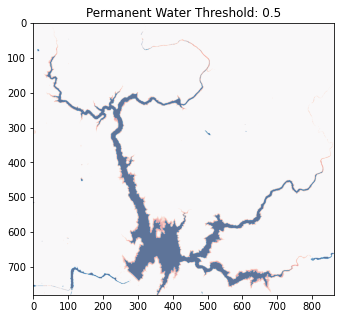

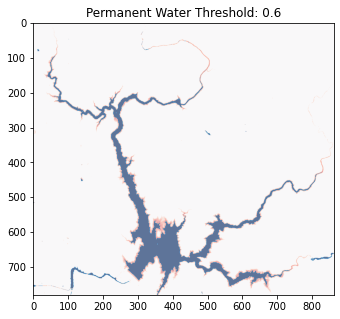

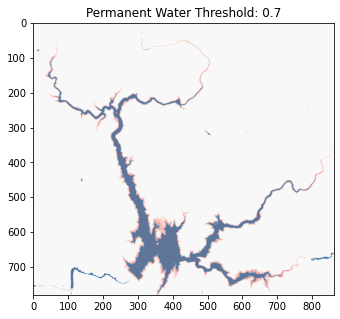

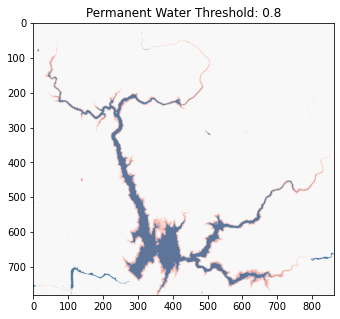

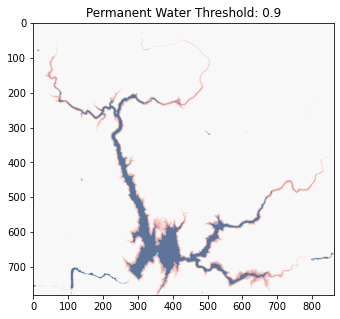

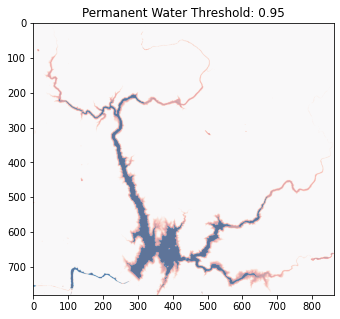

In [58]:
for thresh in [.5, .6, .7, .8, .9, .95]:
    avg_pixel = np.mean(t, 0)
    
    perm = avg_pixel > thresh # gets average of each pixel across all 80 images
    ephemeral = np.where((avg_pixel > 0.1) & (avg_pixel <= thresh), avg_pixel, 0)
    
    esa_perm = (perm.flatten().sum() * (30 ** 2)) # estimates surface area for permanent water
    esa_ephemeral = (ephemeral.flatten().sum() * (30 ** 2)) # estimates surface area for ephemeral water

    fig, axes = plt.subplots(ncols=1, figsize=(8, 5))

    axes.imshow(perm, cmap=plt.cm.Blues)
    axes.set_title('Permanent Water Threshold: {}'.format(thresh))
    
    axes.imshow(ephemeral, cmap=plt.cm.Reds, alpha=0.35)
    axes.set_title('Permanent Water Threshold: {}'.format(thresh))
        
    plt.show()

### Using Folium to display an image from an ImageCollection

In [44]:
# import a collection and convert to an image
image = ee.Image(ee.ImageCollection('LANDSAT/LC08/C02/T1_TOA') 
                       .filterBounds(aoi) 
                       .filterDate(ee.Date('2020-08-01'), ee.Date('2020-08-31')) 
                       .first() 
                       .clip(aoi))

In [45]:
# Create an NDWI image, define visualization parameters and display.
ndwi = image.normalizedDifference(['B3', 'B6'])
ndwi_viz = {'min': 0.4, 'max': 1, 'palette': ['blue', 'red']
}

In [46]:
# Mask the non-watery parts of the image, where NDWI < 0.1.
ndwi_masked = ndwi.updateMask(ndwi.gte(0))

# Define a map centered on Lake Oroville.
map_ndwi_masked = folium.Map(location=[39.58, -121.47], zoom_start=11)

# Add the image layer to the map and display it.
map_ndwi_masked.add_ee_layer(image, {'min': .4, 'max': 1}, 'land mask')
map_ndwi_masked.add_ee_layer(ndwi_masked, ndwi_viz, 'NDWI masked')
display(map_ndwi_masked)

In [47]:
image_rgb = image.visualize(**{'bands': ['B5', 'B4', 'B6'], 'max': 0.5})
ndwi_rgb = ndwi_masked.visualize(**{
    'min': 0.5,
    'max': 1,
    'palette': ['00FFFF', '0000FF']
})

In [48]:
# Mosaic the visualization layers and display (or export).
mosaic = ee.ImageCollection([image_rgb, ndwi_rgb]).mosaic()

# Define a map centered on Lake Oroville.
map_mosaic = folium.Map(location=[39.58, -121.47], zoom_start=11)

# Add the image layer to the map and display it.
map_mosaic.add_ee_layer(mosaic, None, 'mosaic')
display(map_mosaic)